# Dataset Mendeley

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

ModuleNotFoundError: No module named 'google.colab'

In [11]:
!pip install cv2

ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2


In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pyplot import imread, show
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)
#from skimage.io import imread
import os
import cv2

from sklearn.decomposition import PCA

ModuleNotFoundError: No module named 'cv2'

In [2]:
from PIL import Image

In [12]:
#chemins vers le dataset 1 Mendeley sur le drive partagé par l'équipe projet.
chemin_baso = '/content/drive/MyDrive/Kaggle/DataScientest_Blood_Cells_project/Mendeley_Data_Barcelona/basophil/'
chemin_eos = '/content/drive/MyDrive/Kaggle/DataScientest_Blood_Cells_project/Mendeley_Data_Barcelona/eosinophil/'
chemin_eryt = '/content/drive/MyDrive/Kaggle/DataScientest_Blood_Cells_project/Mendeley_Data_Barcelona/erythroblast/'
chemin_ig = '/content/drive/MyDrive/Kaggle/DataScientest_Blood_Cells_project/Mendeley_Data_Barcelona/ig/'
chemin_lym = '/content/drive/MyDrive/Kaggle/DataScientest_Blood_Cells_project/Mendeley_Data_Barcelona/lymphocyte/'
chemin_mon = '/content/drive/MyDrive/Kaggle/DataScientest_Blood_Cells_project/Mendeley_Data_Barcelona/monocyte/'
chemin_pla = '/content/drive/MyDrive/Kaggle/DataScientest_Blood_Cells_project/Mendeley_Data_Barcelona/platelet/'
chemin_neut = '/content/drive/MyDrive/Kaggle/DataScientest_Blood_Cells_project/Mendeley_Data_Barcelona/neutrophil/'

In [3]:
chemin_baso = '/home/juliacnc/code/Juliacnc/Projet/PBC_dataset_normal_DIB/basophil/'
chemin_eos = '/home/juliacnc/code/Juliacnc/Projet/PBC_dataset_normal_DIB/eosinophil/'
chemin_eryt = '/home/juliacnc/code/Juliacnc/Projet/PBC_dataset_normal_DIB/erythroblast/'
chemin_ig = '/home/juliacnc/code/Juliacnc/Projet/PBC_dataset_normal_DIB/ig/'
chemin_lym = '/home/juliacnc/code/Juliacnc/Projet/PBC_dataset_normal_DIB/lymphocyte/'
chemin_mon = '/home/juliacnc/code/Juliacnc/Projet/PBC_dataset_normal_DIB/monocyte/'
chemin_pla = '/home/juliacnc/code/Juliacnc/Projet/PBC_dataset_normal_DIB/platelet/'
chemin_neut = '/home/juliacnc/code/Juliacnc/Projet/PBC_dataset_normal_DIB/neutrophil/'

In [4]:
baso_list = os.listdir(chemin_baso)
eos_list = os.listdir(chemin_eos)
eryt_list = os.listdir(chemin_eryt)
ig_list = os.listdir(chemin_ig)
lym_list = os.listdir(chemin_lym)
mon_list = os.listdir(chemin_mon)
pla_list = os.listdir(chemin_pla)
neut_list = os.listdir(chemin_neut)

In [5]:
chemins_tot=[chemin_baso,chemin_eos,chemin_eryt,chemin_ig,chemin_lym,chemin_mon,chemin_pla,chemin_neut]
images_tot=[baso_list,eos_list,eryt_list,ig_list,lym_list,mon_list,pla_list,neut_list]

Nettoyage

In [6]:
#fonction de nettoyage des doublons :
def nettoyage(liste_im):
    detect_doubles=[liste_im[i].split('(') for i in range(len(liste_im))]
    liste_propre=[detect_doubles[i][0] for i in range(len(detect_doubles)) if len(detect_doubles[i])<2]
    return liste_propre

In [7]:
#nettoyage des données, doublons s'il y en a + fichiers endommagés du dossier neutrophiles

for index,liste in enumerate(images_tot) :
    nouv_liste=nettoyage(liste)
    if liste==neut_list:
        enlev=[]
        for i in range(len(nouv_liste)) :
        #for i in range(-1,-(len(nouv_liste)+1),-1) :
            if cv2.imread(chemin_neut+nouv_liste[i]) is None:
                #print(nouv_liste[i],i)
                enlev.append(i)
            #try :
            #    cv2.imread(chemin_neut+nouv_liste[i]).dtype
            #except AttributeError:
            #    print(nouv_liste[i],i)
            #    nouv_liste.pop(i)
        for a,l in enumerate(enlev):
            nouv_liste.pop(l-a)

    images_tot[index]=nouv_liste

#réaffectation :    
baso_list = images_tot[0]
eos_list =images_tot[1]
eryt_list =images_tot[2]
ig_list=images_tot[3]
lym_list=images_tot[4]
mon_list=images_tot[5]
pla_list =images_tot[6]
neut_list=images_tot[7]

Listes des noms de fichier pour chaque catégories de cellules


In [8]:
data_ba = {'image':baso_list, 'code_g':'BA', 'cell_type':'basophil',
        'height':[cv2.imread(chemin_baso+image_file).shape[0] for image_file in baso_list],
        'width':[cv2.imread(chemin_baso+image_file).shape[1] for image_file in baso_list]}

data_eos={'image':eos_list, 'code_g':'EO', 'cell_type':'eosinophil', 
        'height':[cv2.imread(chemin_eos+image_file).shape[0] for image_file in eos_list],
        'width':[cv2.imread(chemin_eos+image_file).shape[1] for image_file in eos_list]}

data_eryt={'image':eryt_list, 'code_g':'ER', 'cell_type':'erythroblast',
        'height':[cv2.imread(chemin_eryt+image_file).shape[0] for image_file in eryt_list],
        'width':[cv2.imread(chemin_eryt+image_file).shape[1] for image_file in eryt_list]}

data_ig={'image':ig_list, 'code_g':'IG', 'cell_type':'ig',
        'height':[cv2.imread(chemin_ig+image_file).shape[0] for image_file in ig_list],
        'width':[cv2.imread(chemin_ig+image_file).shape[1] for image_file in ig_list]}

data_lym={'image':lym_list, 'code_g':'LYM', 'cell_type':'lymphocyte',
        'height':[cv2.imread(chemin_lym+image_file).shape[0] for image_file in lym_list],
        'width':[cv2.imread(chemin_lym+image_file).shape[1] for image_file in lym_list]}

data_mon={'image':mon_list, 'code_g':'MON', 'cell_type':'monocyte',
        'height':[cv2.imread(chemin_mon+image_file).shape[0] for image_file in mon_list],
        'width':[cv2.imread(chemin_mon+image_file).shape[1] for image_file in mon_list]}

data_pla={'image':pla_list, 'code_g':'PLA', 'cell_type':'platelet',
        'height':[cv2.imread(chemin_pla+image_file).shape[0] for image_file in pla_list],
        'width':[cv2.imread(chemin_pla+image_file).shape[1] for image_file in pla_list]}

data_neut={'image':neut_list, 'code_g':'NEU', 'cell_type':'neutrophil',
        'height':[cv2.imread(chemin_neut+image_file).shape[0] for image_file in neut_list],
        'width':[cv2.imread(chemin_neut+image_file).shape[1] for image_file in neut_list]}

Création d'un DataFrame contenant les informations disponibles sur le dataset

In [9]:
df_baso = pd.DataFrame(data_ba)
df_eos=pd.DataFrame(data_eos)
df_ery=pd.DataFrame(data_eryt)
df_ig=pd.DataFrame(data_ig)
df_lym=pd.DataFrame(data_lym)
df_mon=pd.DataFrame(data_mon)
df_pla=pd.DataFrame(data_pla)
df_neu=pd.DataFrame(data_neut)

df_baso['chemin']=chemin_baso
df_eos['chemin']=chemin_eos
df_ery['chemin']=chemin_eryt
df_ig['chemin']=chemin_ig
df_lym['chemin']=chemin_lym
df_mon['chemin']=chemin_mon
df_pla['chemin']=chemin_pla
df_neu['chemin']=chemin_neut

df_barc = pd.concat([df_baso, df_eos,df_ery,df_ig,df_lym,df_mon,df_pla,df_neu])
df_barc.reset_index(drop=True,inplace=True)

#print(df_barc.head())
#df_barc.info()
df_barc.shape

(17092, 6)

In [10]:
# création de la colonne code_spe :

df_barc_test=pd.DataFrame(df_barc['image'].str.split('_'))

df_barc['code_spe']=[df_barc_test.iloc[i,0][0] for i in range(df_barc_test.shape[0])]

df_barc.tail()

,image,code_g,cell_type,height,width,chemin,code_spe
17087,BNE_568376.jpg,NEU,neutrophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,BNE
17088,BNE_721486.jpg,NEU,neutrophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,BNE
17089,SNE_880408.jpg,NEU,neutrophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,SNE
17090,BNE_169393.jpg,NEU,neutrophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,BNE
17091,BNE_310148.jpg,NEU,neutrophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,BNE



Calcul des images moyennes

In [11]:
#Création d'un dictionnaire contenant l'image moyenne pour chaque catégorie :

Images_Moy={}
for LISTE,chem in zip(images_tot,chemins_tot):
    modele=imread(chem+LISTE[0]) #sélection d'une image pour fixer les dimension de la future image moyenne
    image_moy=np.zeros(modele.shape)
    #Idéalement, il faudrait créer un df contenant toutes les shapes de LISTE, 
    #déterminer la plus représentée, et la prendre alors comme modèle, pas juste la première image arbitrairement.
    
    for image_file in LISTE:
        image = imread(chem+image_file)
        
        if image.shape != modele.shape:
            #mise aux bonnes dimensions : 
            dim = (modele.shape[1], modele.shape[0]) # dim s'écrit (largeur,hauteur)
            # resize image
            image = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
            
        image_moy+=image
        
    Images_Moy[str(f"Mean_image_{chem.split('/')[-2]}")]=image_moy/len(LISTE)

In [12]:
clefs=[cle for cle in Images_Moy.keys()]


Création d'images réduites des moyennes avec seuil pour calcul du nombre de pixel

In [13]:
res_baso = cv2.resize(Images_Moy['Mean_image_basophil'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_baso = cv2.cvtColor(res_baso,cv2.COLOR_RGB2GRAY) #from 3D to 1D
res_baso = cv2.threshold(res_baso, 127, 255, cv2.THRESH_BINARY)[1]

res_eos = cv2.resize(Images_Moy['Mean_image_eosinophil'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_eos = cv2.cvtColor(res_eos,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_eos = cv2.threshold(res_eos, 127, 255, cv2.THRESH_BINARY)[1]

res_ery = cv2.resize(Images_Moy['Mean_image_erythroblast'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_ery = cv2.cvtColor(res_ery,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_ery = cv2.threshold(res_ery, 127, 255, cv2.THRESH_BINARY)[1]

res_ig = cv2.resize(Images_Moy['Mean_image_ig'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_ig = cv2.cvtColor(res_ig,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_ig = cv2.threshold(res_ig, 127, 255, cv2.THRESH_BINARY)[1]

res_lym = cv2.resize(Images_Moy['Mean_image_lymphocyte'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_lym = cv2.cvtColor(res_lym,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_lym = cv2.threshold(res_lym, 127, 255, cv2.THRESH_BINARY)[1]

res_mon = cv2.resize(Images_Moy['Mean_image_monocyte'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_mon = cv2.cvtColor(res_mon,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_mon = cv2.threshold(res_mon, 127, 255, cv2.THRESH_BINARY)[1]

res_neu = cv2.resize(Images_Moy['Mean_image_neutrophil'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_neu = cv2.cvtColor(res_neu,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_neu = cv2.threshold(res_neu, 127, 255, cv2.THRESH_BINARY)[1]

res_pla = cv2.resize(Images_Moy['Mean_image_platelet'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_pla = cv2.cvtColor(res_pla,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_pla = cv2.threshold(res_pla, 127, 255, cv2.THRESH_BINARY)[1]


In [14]:
res_list=[res_baso,res_eos,res_ery,res_ig,res_lym,res_mon,res_neu,res_pla]
nbr_pixel=[np.sum(type_cell==0)for type_cell in res_list]
ratio_image=[i*100/(240*240) for i in nbr_pixel]
#ratio_image est la part de l'image remplie par la cellule, plus précise que le nombre de pixel, qui lui dépend du resize appliqué

Création d'un DataFrame image type (contenant notamment un exemple par catégorie) 

In [15]:
df2= df_barc.groupby('code_g').apply(lambda x: x.sample(1)).reset_index(drop=True)

df2['im_moy_seuil']=res_list
df2['nb_px']=nbr_pixel
df2['ratio_px']=ratio_image

df2

,image,code_g,cell_type,height,width,chemin,code_spe,im_moy_seuil,nb_px,ratio_px
0,BA_817842.jpg,BA,basophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,BA,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",130,0.225694
1,EO_221996.jpg,EO,eosinophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,EO,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",134,0.232639
2,ERB_423288.jpg,ER,erythroblast,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,ERB,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",58,0.100694
3,MY_694640.jpg,IG,ig,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,MY,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",129,0.223958
4,LY_842128.jpg,LYM,lymphocyte,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,LY,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",83,0.144097
5,MO_169657.jpg,MON,monocyte,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,MO,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",143,0.248264
6,BNE_426408.jpg,NEU,neutrophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,BNE,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",92,0.159722
7,PLATELET_589098.jpg,PLA,platelet,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,PLATELET,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",19,0.032986


Nombre moyen d'images dans chaque cohorte

In [17]:
cells = "/home/juliacnc/code/Juliacnc/Projet/PBC_dataset_normal_DIB"

In [18]:
glob_list = os.listdir(cells)

In [19]:
nb_photos = [len(os.listdir(cells + "/" + name))for name in glob_list]

In [20]:
df_glob = pd.DataFrame(
    index=glob_list,
    data=nb_photos,
    columns=["nb_photos"])

df_glob

,nb_photos
monocyte,1420
ig,2895
lymphocyte,1214
platelet,2348
basophil,1218
eosinophil,3117
neutrophil,3329
erythroblast,1551


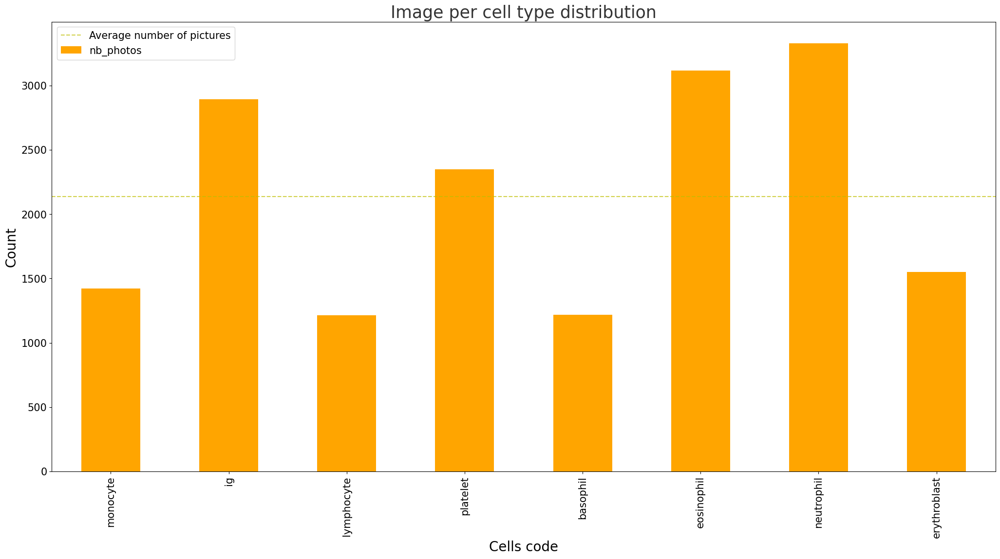

''

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(25,12))
df_glob.plot(kind="bar",color='orange',
               legend=False,
               ax=ax)
ax.axhline(df_glob["nb_photos"].mean(),
           color='y', alpha=.7,
           linestyle='--',
           label="Average number of pictures")
plt.title("Image per cell type distribution",
          color="#343434", fontsize=25)
plt.xlabel('Cells code', fontsize=20)
plt.xticks(rotation = 90,fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('Count', fontsize=20)
plt.legend(fontsize=15)
plt.show()
;

Affichage d'une image de chaque cohorte, avec histogramme des composantes RGB et comparaison avec les composantes moyennes

In [32]:
#dictionnaire des images exemples
img={}

for image_file in df2['image']:
    a=df2['cell_type'].loc[df2['image']==image_file]
    img[str(a.iloc[0])]=imread(df2['chemin'].loc[df2['image']==image_file].iloc[0]+str(image_file))

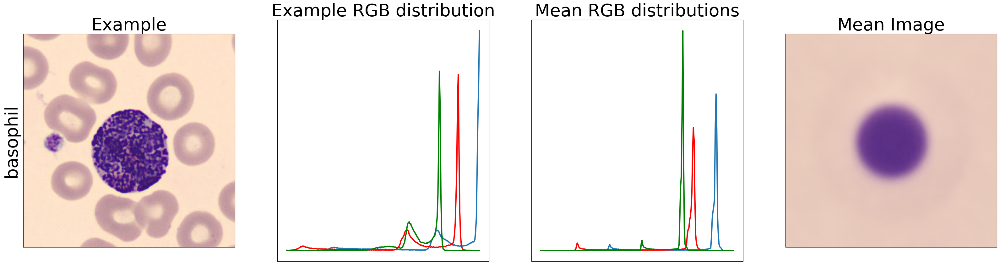

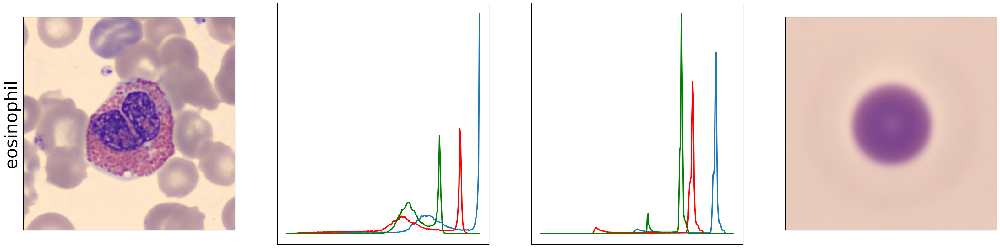

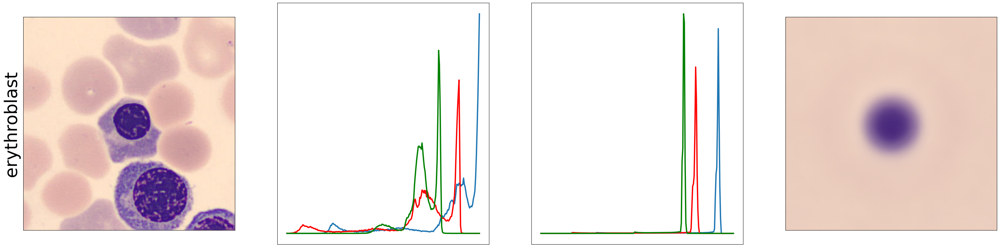

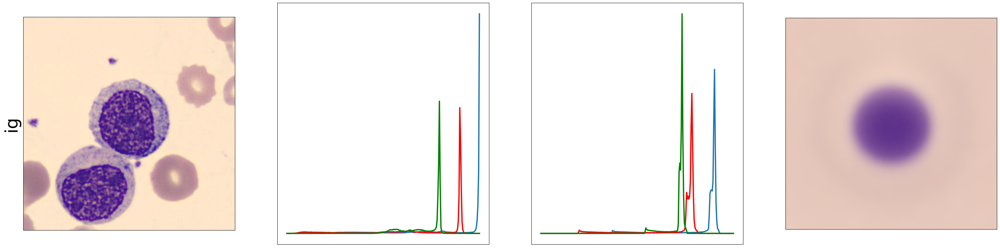

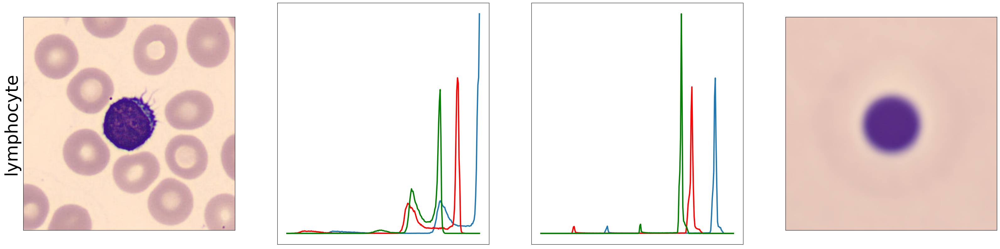

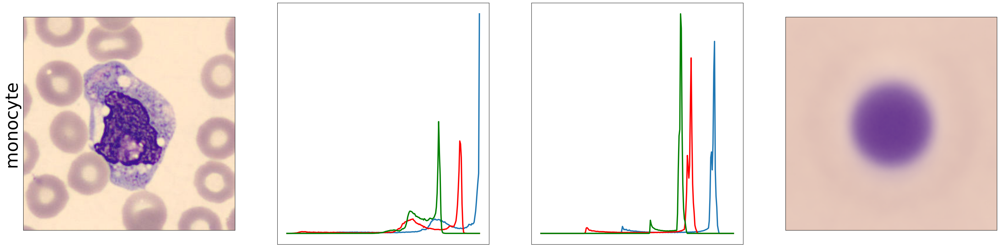

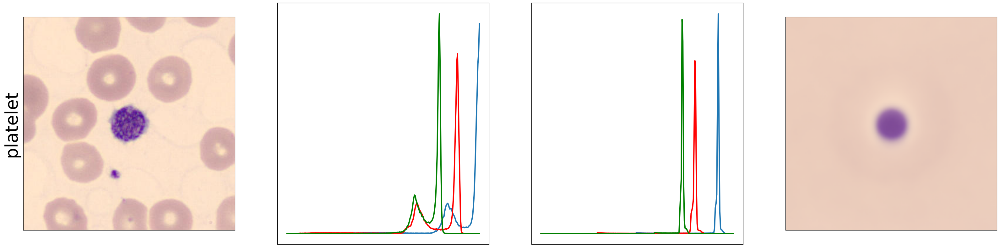

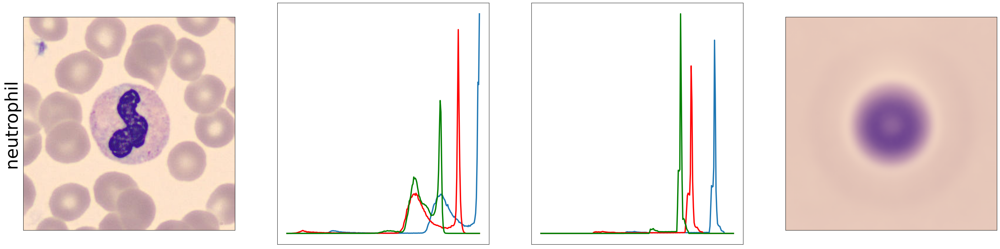

In [23]:
for i,cell in enumerate(clefs):
    cell2=cell.split('_')[-1]
    
    image=Images_Moy[cell].astype('uint8')
    blue_color = cv2.calcHist([image], [0], None, [256], [0,256])
    red_color = cv2.calcHist([image], [1], None, [256], [0,256])
    green_color = cv2.calcHist([image], [2], None, [256], [0,256])
    
    blue_color_ex = cv2.calcHist([img[cell2]], [0], None, [256], [0,256])
    red_color_ex = cv2.calcHist([img[cell2]], [1], None, [256], [0,256])
    green_color_ex = cv2.calcHist([img[cell2]], [2], None, [256], [0,256])
    
    plt.figure(figsize=(40,10))
    plt.subplot(1,4,4)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image)
    if i==0:
        plt.title('Mean Image',fontsize=40)
    
    plt.subplot(1,4,3)
    plt.plot(range(0,256), blue_color, lw=3)
    plt.plot(range(0,256), red_color, color='red', lw=3)
    plt.plot(range(0,256), green_color, color='green', lw=3)
    plt.xticks([])
    plt.yticks([])
    if i==0:
        plt.title('Mean RGB distributions',fontsize=40)
        
    plt.subplot(1,4,1)
    plt.imshow(img[cell2])
    plt.xticks([])
    plt.yticks([])
    plt.ylabel(cell2,fontsize=40)
    if i==0:
        plt.title('Example',fontsize=40)
        
    plt.subplot(1,4,2)
    plt.plot(range(0,256), blue_color_ex, lw=3)
    plt.plot(range(0,256), red_color_ex, color='red', lw=3)
    plt.plot(range(0,256), green_color_ex, color='green', lw=3)
    plt.xticks([])
    plt.yticks([])
    if i==0:
        plt.title('Example RGB distribution',fontsize=40)

Affichage des histogrammes des pixel values pour les images moyennes

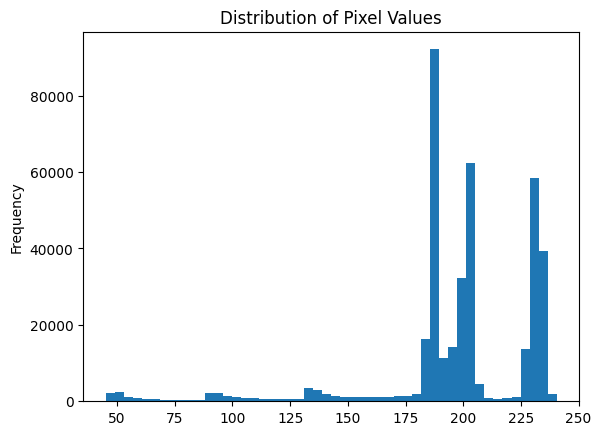

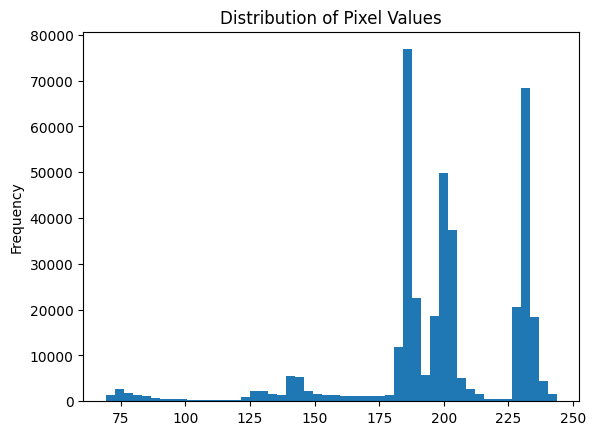

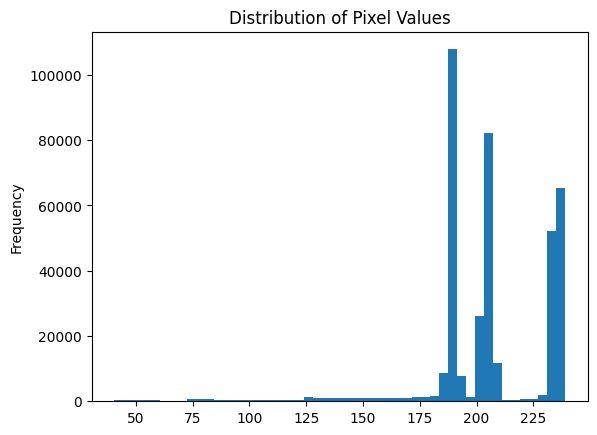

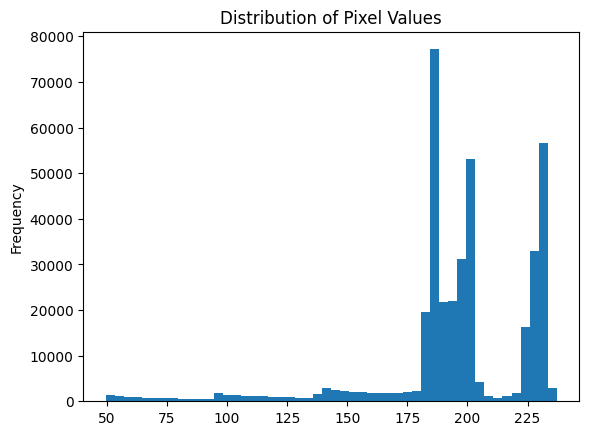

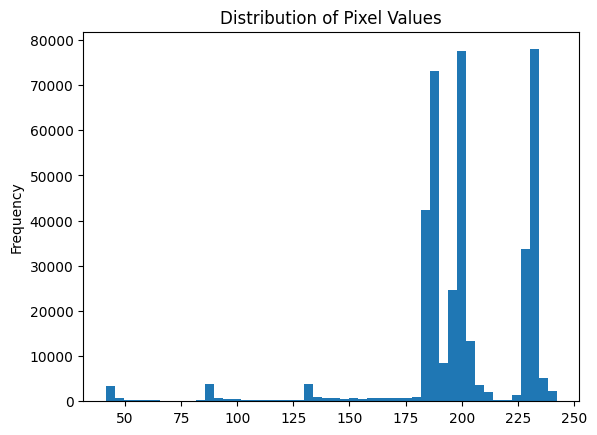

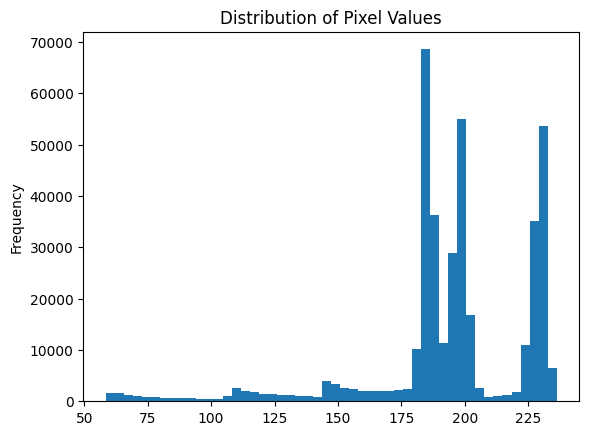

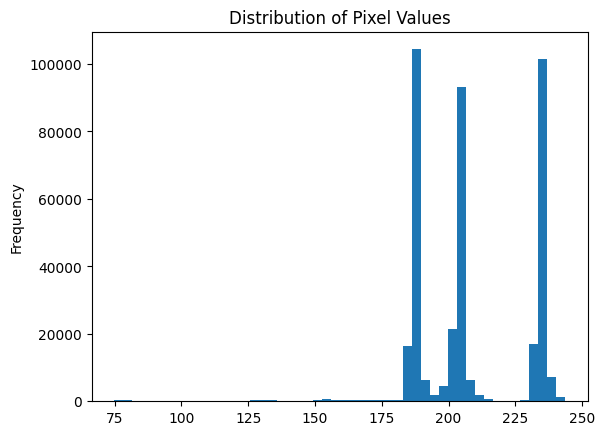

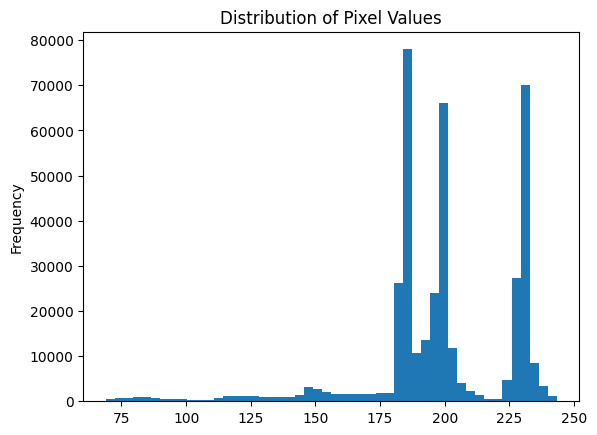

In [24]:
for cle in clefs :
    pd.Series(Images_Moy[cle].flatten()).plot(kind='hist', bins=50, title='Distribution of Pixel Values')
    plt.show()
    
    #ajouter titres
    #ajouter légendes
    #mettre éventuellement en subplot pour afficher 4 par ligne sur 2 lignes par exemple
    
    

Affichage des images seuillées:

In [25]:
df2_crois=df2.sort_values(by=['nb_px'],ascending=True)

In [41]:
df2_crois.head(8)

,image,code_g,cell_type,height,width,chemin,code_spe,im_moy_seuil,nb_px,ratio_px
7,PLATELET_589098.jpg,PLA,platelet,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,PLATELET,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",19,0.032986
2,ERB_423288.jpg,ER,erythroblast,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,ERB,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",58,0.100694
4,LY_842128.jpg,LYM,lymphocyte,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,LY,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",83,0.144097
6,BNE_426408.jpg,NEU,neutrophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,BNE,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",92,0.159722
3,MY_694640.jpg,IG,ig,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,MY,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",129,0.223958
0,BA_817842.jpg,BA,basophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,BA,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",130,0.225694
1,EO_221996.jpg,EO,eosinophil,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,EO,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",134,0.232639
5,MO_169657.jpg,MON,monocyte,363,360,/home/juliacnc/code/Juliacnc/Projet/PBC_datase...,MO,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",143,0.248264


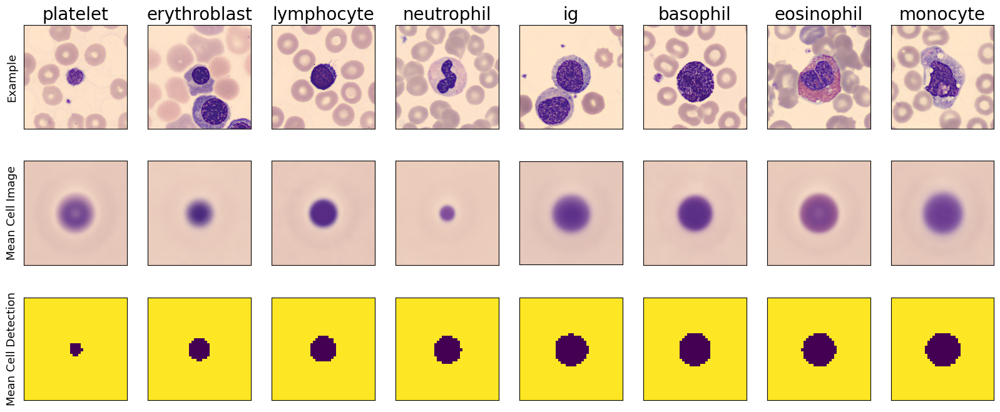

In [42]:
## A CORRIGER erreur non résolue le code alternatif ci-dessus ne marche pas non plus

plt.figure(figsize=(20,8))

for i,l in enumerate(df2_crois.index):
    plt.subplot(3,8,i+1)
    plt.title(df2_crois['cell_type'].loc[l], fontsize=20)
    plt.imshow(img[df2_crois['cell_type'].loc[l]])
    plt.xticks([])
    plt.yticks([])
    if i==0:
        plt.ylabel('Example', fontsize=13)
    
    plt.subplot(3,8,i+9)
    plt.imshow(Images_Moy[clefs[l]].astype('uint8'))
    plt.xticks([])
    plt.yticks([])
    if i==0:
        plt.ylabel('Mean Cell Image', fontsize=13)
    
    plt.subplot(3,8,i+17)
    plt.imshow(df2_crois['im_moy_seuil'].iloc[i])
    plt.xticks([])
    plt.yticks([])
    if i==0:
        plt.ylabel('Mean Cell Detection', fontsize=13)



In [38]:
print(img)

{'basophil': array([[[254, 228, 195],
        [254, 227, 197],
        [255, 228, 199],
        ...,
        [228, 194, 182],
        [221, 187, 177],
        [217, 183, 174]],

       [[255, 229, 199],
        [255, 229, 199],
        [255, 229, 200],
        ...,
        [225, 191, 179],
        [219, 185, 175],
        [215, 181, 172]],

       [[255, 230, 200],
        [255, 229, 200],
        [255, 229, 200],
        ...,
        [222, 188, 176],
        [216, 182, 173],
        [213, 179, 170]],

       ...,

       [[253, 227, 202],
        [253, 227, 202],
        [254, 228, 203],
        ...,
        [224, 194, 184],
        [223, 195, 183],
        [223, 195, 181]],

       [[252, 226, 201],
        [253, 227, 202],
        [254, 228, 203],
        ...,
        [214, 184, 174],
        [213, 185, 173],
        [213, 185, 171]],

       [[252, 226, 201],
        [253, 227, 202],
        [254, 228, 203],
        ...,
        [211, 181, 171],
        [211, 181, 170],
        [21

Tracé d'une flèche diamètre croissant :

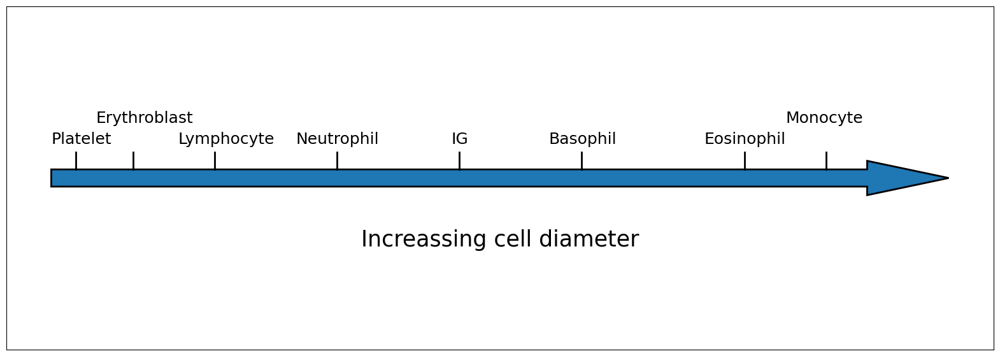

''

In [ ]:
plt.figure(figsize=(20,7))
plt.arrow(0, 1,1000,0, width = 0.05, head_width = 0.1 , 
    head_length = 100, linewidth=2)

plt.plot([30,30],[1.025,1.075],'k', lw=2)
plt.plot([100,100],[1.025,1.075],'k', lw=2)
plt.plot([200,200],[1.025,1.075],'k', lw=2)
plt.plot([350,350],[1.025,1.075],'k', lw=2)
plt.plot([500,500],[1.025,1.075],'k', lw=2)
plt.plot([650,650],[1.025,1.075],'k', lw=2)
plt.plot([850,850],[1.025,1.075],'k', lw=2)
plt.plot([950,950],[1.025,1.075],'k', lw=2)
plt.ylim((0.5,1.5))

plt.text(0,1.1,'Platelet', fontsize=18)
plt.text(55,1.16,'Erythroblast', fontsize=18)
plt.text(155,1.1,'Lymphocyte', fontsize=18)
plt.text(300,1.1,'Neutrophil', fontsize=18)
plt.text(490,1.1,'IG', fontsize=18)
plt.text(610,1.1,'Basophil', fontsize=18)
plt.text(800,1.1,'Eosinophil', fontsize=18)
plt.text(900,1.16,'Monocyte', fontsize=18)

plt.xticks([])
plt.yticks([])
plt.text(380,0.8,'Increassing cell diameter', fontsize=25)

plt.show()

;

Préparation des images moyennes pour le calcul de la PCA

In [ ]:
glob_list = df2.cell_type.astype('str')

shapes=[Images_Moy[cle].shape for cle in clefs]
#print(shapes)
dim=(360,360)
cell_moy=[cv2.resize(Images_Moy[i], dim, interpolation = cv2.INTER_AREA) for i in clefs]
cells_moy=[cell_moy[i].reshape(360*360*3) for i in range(len(cell_moy))]
cells_moy[0].shape


(388800,)

In [ ]:
estimator = PCA(n_components=2)
X_pca = estimator.fit_transform(cells_moy)
#X_pca

In [ ]:
colors = ['red', 'green', 'blue', 'orange', 'yellow', 'purple', 'pink', 'grey']

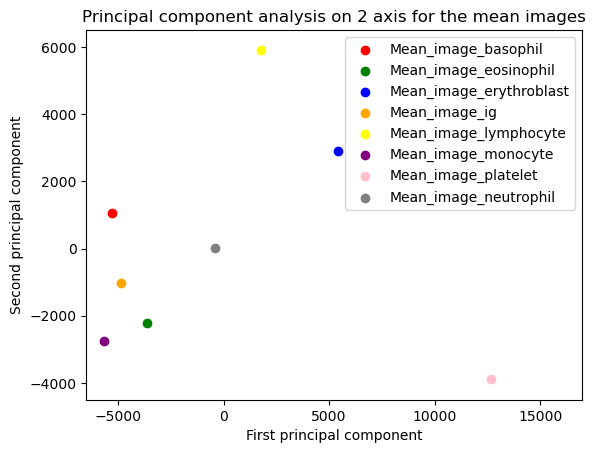

La part de variance expliquée est 0.93


In [ ]:
for i,cle in zip(range(len(colors)),clefs):
    px = X_pca[i, 0]
    py = X_pca[i, 1]
    #pz = X_pca[:, 2]
    plt.scatter(px, py, c=colors[i],label=cle)
    plt.axis([-6500,17000,-4500,6500])
    plt.legend()
    plt.title('Principal component analysis on 2 axis for the mean images')
    plt.xlabel('First principal component')
    plt.ylabel('Second principal component')

plt.show();

print("La part de variance expliquée est", round(estimator.explained_variance_ratio_.sum(),2))

NameError: ignored

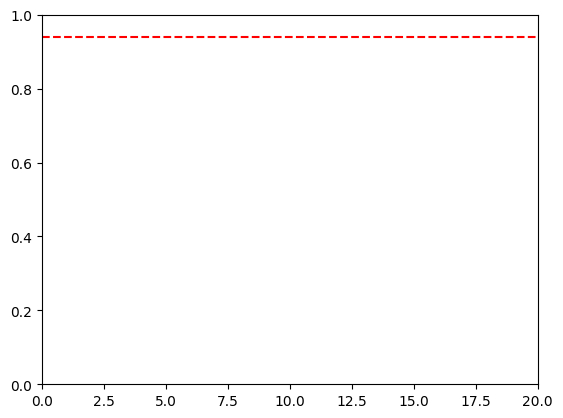

In [ ]:
plt.figure()
plt.xlim(0,20)
plt.axhline(y = 0.94, color ='r', linestyle = '--')
plt.plot(estimator.explained_variance_ratio_.cumsum());

Accès aux données

# Dataset Test



Définition des chemins d'accès à chaque catégorie d'image

In [1]:
#chemins vers le testdataset sur le drive partagé par l'équipe projet.
chemin_baso = '/content/drive/MyDrive/Kaggle/Tests/TestA/Basophil/'
chemin_eos = '/content/drive/MyDrive/Kaggle/Tests/TestA/Eosinophil/'
chemin_eryt = '/content/drive/MyDrive/Kaggle/Tests/TestA/Erythroblast/'
chemin_ig = '/content/drive/MyDrive/Kaggle/Tests/TestA/ig/'
chemin_lym = '/content/drive/MyDrive/Kaggle/Tests/TestA/Lymphocyte/'
chemin_mon = '/content/drive/MyDrive/Kaggle/Tests/TestA/Monocyte/'
chemin_pla = '/content/drive/MyDrive/Kaggle/Tests/TestA/platelet/'
chemin_neut = '/content/drive/MyDrive/Kaggle/Tests/TestA/Neutrophil/'

In [6]:
chemin_baso = 'D:\Work - Data\Projects\Red Blood Cells\Images\Tests\TestA\Basophil'
chemin_eos = 'D:\Work - Data\Projects\Red Blood Cells\Images\Tests\TestA\Eosinophil'
chemin_eryt = 'D:\Work - Data\Projects\Red Blood Cells\Images\Tests\TestA\Erythroblast'
chemin_ig = 'D:\Work - Data\Projects\Red Blood Cells\Images\Tests\TestA\ig'
chemin_lym = 'D:\Work - Data\Projects\Red Blood Cells\Images\Tests\TestA\Lymphocyte'
chemin_mon = 'D:\Work - Data\Projects\Red Blood Cells\Images\Tests\TestA\Monocyte'
chemin_pla = 'D:\Work - Data\Projects\Red Blood Cells\Images\Tests\TestA\platelet/'
chemin_neut = 'D:\Work - Data\Projects\Red Blood Cells\Images\Tests\TestA\Neutrophil'

SyntaxError: (unicode error) 'unicodeescape' codec can't decode bytes in position 58-59: malformed \N character escape (1330477365.py, line 8)

In [ ]:
baso_list = os.listdir(chemin_baso)
eos_list = os.listdir(chemin_eos)
eryt_list = os.listdir(chemin_eryt)
ig_list = os.listdir(chemin_ig)
lym_list = os.listdir(chemin_lym)
mon_list = os.listdir(chemin_mon)
pla_list = os.listdir(chemin_pla)
neut_list = os.listdir(chemin_neut)

In [ ]:
chemins_tot=[chemin_baso,chemin_eos,chemin_eryt,chemin_ig,chemin_lym,chemin_mon,chemin_pla,chemin_neut]
images_tot=[baso_list,eos_list,eryt_list,ig_list,lym_list,mon_list,pla_list,neut_list]

In [ ]:
#optional resizing of test images

import os
from PIL import Image
from tqdm import tqdm

# Set up directories and parameters
data_dir = '/content/drive/MyDrive/Kaggle/Tests/TestA'
img_height = 360
img_width = 360

# Resize images in data_dir
for class_dir in os.listdir(data_dir):
    full_class_dir = os.path.join(data_dir, class_dir)
    if os.path.isdir(full_class_dir):
        for img_file in tqdm(os.listdir(full_class_dir)):
            if img_file.startswith('resized_'):
                continue
            try:
                img_path = os.path.join(full_class_dir, img_file)
                img = Image.open(img_path)
                img = img.resize((img_height, img_width))
                new_file_name = "resized_" + img_file
                new_img_path = os.path.join(full_class_dir, new_file_name)
                img.save(new_img_path)
            except (OSError, IOError):
                print(f"Unsupported file: {img_file}")

100%|██████████| 2660/2660 [00:00<00:00, 1504226.59it/s]


Nettoyage

Listes des noms de fichier pour chaque catégories de cellules


In [ ]:
data_ba = {'image':baso_list, 'code_g':'BA', 'cell_type':'Basophil',
        'height':[cv2.imread(chemin_baso+image_file).shape[0] for image_file in baso_list],
        'width':[cv2.imread(chemin_baso+image_file).shape[1] for image_file in baso_list]}

data_eos={'image':eos_list, 'code_g':'EO', 'cell_type':'eosinophil', 
        'height':[cv2.imread(chemin_eos+image_file).shape[0] for image_file in eos_list],
        'width':[cv2.imread(chemin_eos+image_file).shape[1] for image_file in eos_list]}

data_eryt={'image':eryt_list, 'code_g':'ER', 'cell_type':'erythroblast',
        'height':[cv2.imread(chemin_eryt+image_file).shape[0] for image_file in eryt_list],
        'width':[cv2.imread(chemin_eryt+image_file).shape[1] for image_file in eryt_list]}

data_ig={'image':ig_list, 'code_g':'IG', 'cell_type':'ig',
        'height':[cv2.imread(chemin_ig+image_file).shape[0] for image_file in ig_list],
        'width':[cv2.imread(chemin_ig+image_file).shape[1] for image_file in ig_list]}

data_lym={'image':lym_list, 'code_g':'LYM', 'cell_type':'lymphocyte',
        'height':[cv2.imread(chemin_lym+image_file).shape[0] for image_file in lym_list],
        'width':[cv2.imread(chemin_lym+image_file).shape[1] for image_file in lym_list]}

data_mon={'image':mon_list, 'code_g':'MON', 'cell_type':'monocyte',
        'height':[cv2.imread(chemin_mon+image_file).shape[0] for image_file in mon_list],
        'width':[cv2.imread(chemin_mon+image_file).shape[1] for image_file in mon_list]}

data_pla={'image':pla_list, 'code_g':'PLA', 'cell_type':'platelet',
        'height':[cv2.imread(chemin_pla+image_file).shape[0] for image_file in pla_list],
        'width':[cv2.imread(chemin_pla+image_file).shape[1] for image_file in pla_list]}

data_neut={'image':neut_list, 'code_g':'NEU', 'cell_type':'neutrophil',
        'height':[cv2.imread(chemin_neut+image_file).shape[0] for image_file in neut_list],
        'width':[cv2.imread(chemin_neut+image_file).shape[1] for image_file in neut_list]}

Création d'un DataFrame contenant les informations disponibles sur le dataset

In [ ]:
df_baso = pd.DataFrame(data_ba)
df_eos=pd.DataFrame(data_eos)
df_ery=pd.DataFrame(data_eryt)
df_ig=pd.DataFrame(data_ig)
df_lym=pd.DataFrame(data_lym)
df_mon=pd.DataFrame(data_mon)
df_pla=pd.DataFrame(data_pla)
df_neu=pd.DataFrame(data_neut)

df_baso['chemin']=chemin_baso
df_eos['chemin']=chemin_eos
df_ery['chemin']=chemin_eryt
df_ig['chemin']=chemin_ig
df_lym['chemin']=chemin_lym
df_mon['chemin']=chemin_mon
df_pla['chemin']=chemin_pla
df_neu['chemin']=chemin_neut

df_test = pd.concat([df_baso, df_eos,df_ery,df_ig,df_lym,df_mon,df_pla,df_neu])
df_test.reset_index(drop=True,inplace=True)

#print(df_barc.head())
#df_barc.info()
df_test.shape

(4350, 6)

In [ ]:
chemins_tot=[chemin_baso,chemin_eos,chemin_eryt,chemin_ig,chemin_lym,chemin_mon,chemin_pla,chemin_neut]
images_tot=[baso_list,eos_list,eryt_list,ig_list,lym_list,mon_list,pla_list,neut_list]

In [ ]:
df_test[0:1]

,image,code_g,cell_type,height,width,chemin,code_spe
0,resized_20190526_163835_0.jpg,BA,basophil,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Baso...,resized


In [ ]:
# création de la colonne code_spe :

df_test=pd.DataFrame(df_test['image'].str.split('_'))##précédemment df_barc_test

df_test['code_spe']=[df_barc_test.iloc[i,0][0] for i in range(df_barc_test.shape[0])]

df_test.tail()

,image,code_g,cell_type,height,width,chemin,code_spe
4345,resized_95-8-22-4_70_1.jpg,NEU,neutrophil,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Neut...,resized
4346,resized_95-8-22-4_23_1.jpg,NEU,neutrophil,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Neut...,resized
4347,resized_95-8-22-4_54_2.jpg,NEU,neutrophil,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Neut...,resized
4348,resized_95-8-22-3_9_1.jpg,NEU,neutrophil,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Neut...,resized
4349,resized_95-8-22-4_15_1.jpg,NEU,neutrophil,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Neut...,resized


In [ ]:
path_to_save='D:\Work - Data\Projects\Red Blood Cells\CSVs\Test_Images.csv'
df.to_csv(path_to_save, index=False)


Calcul des images moyennes

In [ ]:
#Création d'un dictionnaire contenant l'image moyenne pour chaque catégorie :

Images_Moy={}
for LISTE,chem in zip(images_tot,chemins_tot):
    modele=imread(chem+LISTE[0]) #sélection d'une image pour fixer les dimension de la future image moyenne
    image_moy=np.zeros(modele.shape)
    #Idéalement, il faudrait créer un df contenant toutes les shapes de LISTE, 
    #déterminer la plus représentée, et la prendre alors comme modèle, pas juste la première image arbitrairement.
    
    for image_file in LISTE:
        image = imread(chem+image_file)
        
        if image.shape != modele.shape:
            #mise aux bonnes dimensions : 
            dim = (modele.shape[1], modele.shape[0]) # dim s'écrit (largeur,hauteur)
            # resize image
            image = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
            
        image_moy+=image
        
    Images_Moy[str(f"Mean_image_{chem.split('/')[-2]}")]=image_moy/len(LISTE)

In [ ]:
clefs=[cle for cle in Images_Moy.keys()]


Création d'images réduites des moyennes avec seuil pour calcul du nombre de pixel

In [ ]:
res_baso = cv2.resize(Images_Moy['Mean_image_Basophil'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_baso = cv2.cvtColor(res_baso,cv2.COLOR_RGB2GRAY) #from 3D to 1D
res_baso = cv2.threshold(res_baso, 127, 255, cv2.THRESH_BINARY)[1]

res_eos = cv2.resize(Images_Moy['Mean_image_Eosinophil'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_eos = cv2.cvtColor(res_eos,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_eos = cv2.threshold(res_eos, 127, 255, cv2.THRESH_BINARY)[1]

res_ery = cv2.resize(Images_Moy['Mean_image_Erythroblast'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_ery = cv2.cvtColor(res_ery,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_ery = cv2.threshold(res_ery, 127, 255, cv2.THRESH_BINARY)[1]

res_ig = cv2.resize(Images_Moy['Mean_image_ig'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_ig = cv2.cvtColor(res_ig,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_ig = cv2.threshold(res_ig, 127, 255, cv2.THRESH_BINARY)[1]

res_lym = cv2.resize(Images_Moy['Mean_image_Lymphocyte'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_lym = cv2.cvtColor(res_lym,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_lym = cv2.threshold(res_lym, 127, 255, cv2.THRESH_BINARY)[1]

res_mon = cv2.resize(Images_Moy['Mean_image_Monocyte'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_mon = cv2.cvtColor(res_mon,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_mon = cv2.threshold(res_mon, 127, 255, cv2.THRESH_BINARY)[1]

res_neu = cv2.resize(Images_Moy['Mean_image_Neutrophil'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_neu = cv2.cvtColor(res_neu,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_neu = cv2.threshold(res_neu, 127, 255, cv2.THRESH_BINARY)[1]

res_pla = cv2.resize(Images_Moy['Mean_image_platelet'].astype('uint8') , dsize=(40,40), interpolation=cv2.INTER_CUBIC)
res_pla = cv2.cvtColor(res_pla,cv2.COLOR_RGB2GRAY) #TO 3D to 1D
res_pla = cv2.threshold(res_pla, 127, 255, cv2.THRESH_BINARY)[1]


In [ ]:
res_list=[res_baso,res_eos,res_ery,res_ig,res_lym,res_mon,res_neu,res_pla]
nbr_pixel=[np.sum(type_cell==0)for type_cell in res_list]
ratio_image=[i*100/(240*240) for i in nbr_pixel]
#ratio_image est la part de l'image remplie par la cellule, plus précise que le nombre de pixel, qui lui dépend du resize appliqué

Création d'un DataFrame image type (contenant notamment un exemple par catégorie) 

In [ ]:
df2_test= df_test.groupby('code_g').apply(lambda x: x.sample(1)).reset_index(drop=True)

df2_test['im_moy_seuil']=res_list
df2_test['nb_px']=nbr_pixel
df2_test['ratio_px']=ratio_image

df2_test.head()

,image,code_g,cell_type,height,width,chemin,code_spe,im_moy_seuil,nb_px,ratio_px
0,resized_20190527_114438_0.jpg,BA,basophil,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Baso...,resized,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",271,0.470486
1,resized_95-8-27-1_442_2.jpg,EO,eosinophil,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Eosi...,resized,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",167,0.289931
2,resized_erythroblasts-blood-smear-erythroblast...,ER,erythroblast,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Eryt...,resized,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",49,0.085069
3,resized_metamyelocyte.jpg,IG,ig,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/ig/,resized,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",45,0.078125
4,resized_95-8-22-1_56_1.jpg,LYM,lymphocyte,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Lymp...,resized,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",97,0.168403
5,resized_95-8-17-3_378_1.jpg,MON,monocyte,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Mono...,resized,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",170,0.295139
6,resized_95-9-3-3_123_1.jpg,NEU,neutrophil,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/Neut...,resized,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...",138,0.239583
7,resized_platelet.jpg,PLA,platelet,360,360,/content/drive/MyDrive/Kaggle/Tests/TestA/plat...,resized,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...",745,1.293403


Nombre moyen d'images dans chaque cohorte

In [ ]:
cells = "/content/drive/MyDrive/Kaggle/Tests/TestA"

In [ ]:
glob_list = os.listdir(cells)

In [ ]:
nb_photos = [len(os.listdir(cells + "/" + name))for name in glob_list]

In [ ]:
df_glob_test = pd.DataFrame(
    index=glob_list,
    data=nb_photos,
    columns=["nb_photos"])

df_glob_test

,nb_photos
Lymphocyte,1034
Monocyte,234
Eosinophil,322
Erythroblast,4
ig,4
Basophil,89
platelet,3
Neutrophil,2660


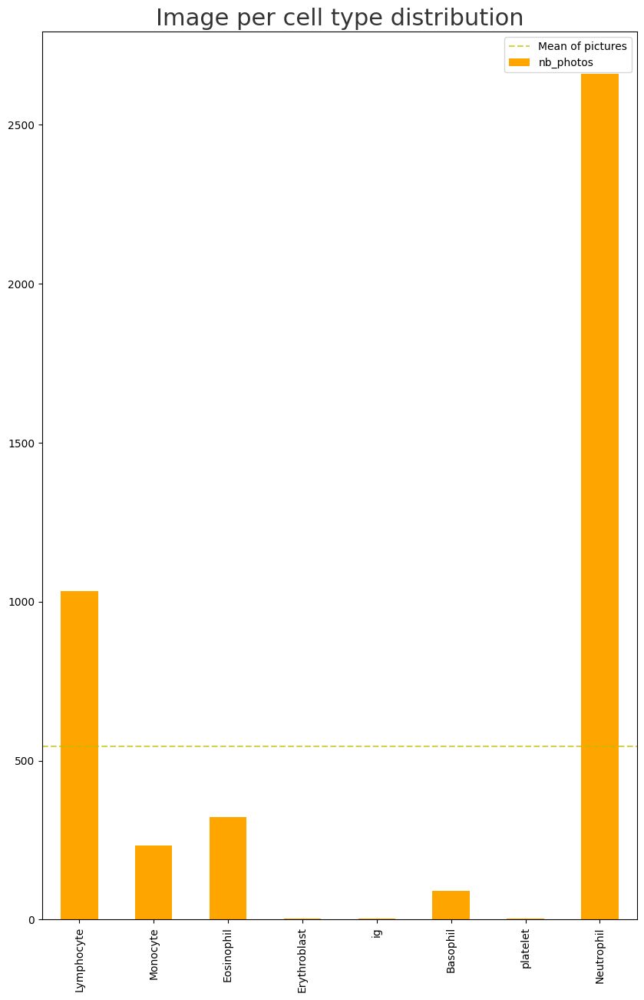

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15,10))
df_glob_test.plot(kind="bar",color='orange',
               legend=False,
               ax=ax)
ax.axhline(df_glob_test["nb_photos"].mean(),
           color='y', alpha=.7,
           linestyle='--',
           label="Mean of pictures")
plt.title("Image per cell type distribution",
          color="#343434", fontsize=22)
plt.xlabel('Cells code', fontsize=25)
plt.xticks(rotation = 90,fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('Count', fontsize=20)
plt.legend(fontsize=15)
plt.show()
;

In [ ]:
#variante log scale
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
df_glob_test.plot(kind="bar", color='orange', legend=False, ax=ax)

ax.axhline(df_glob_test["nb_photos"].mean(), color='y', alpha=.7, linestyle='--', label="Mean of pictures")

plt.title("Image per cell type distribution", color="#343434", fontsize=22)
plt.xlabel('Cells code', fontsize=25)
plt.xticks(rotation=90, fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('Count', fontsize=20)

# Set y-axis to logarithmic scale
plt.yscale('log')

plt.legend(fontsize=15)
plt.show()

Affichage d'une image de chaque cohorte, avec histogramme des composantes RGB et comparaison avec les composantes moyennes

In [ ]:
#dictionnaire des images exemples
img={}

for image_file in df2_test['image']:
    a=df2_test['cell_type'].loc[df2_test['image']==image_file]
    img[str(a.iloc[0])]=imread(df2_test['chemin'].loc[df2_test['image']==image_file].iloc[0]+str(image_file))

# Step 1: Verify the contents of the `img` dictionary
print(img.keys())  # Print the keys in the `img` dictionary to verify its contents

dict_keys(['basophil', 'eosinophil', 'erythroblast', 'ig', 'lymphocyte', 'monocyte', 'neutrophil', 'platelet'])


In [ ]:
##quick fix to circumvolent the initials in subfolders only
# Key mapping dictionary
key_mapping = {
    'basophil': 'Basophil',
    'eosinophil': 'Eosinophil',
    'erythroblast': 'Erythroblast',
    'lymphocyte': 'Lymphocyte',
    'monocyte': 'Monocyte',
    'neutrophil': 'Neutrophil',
}

# Updated code
# Dictionnaire des images exemples
img = {}

for image_file in df2_test['image']:
    a = df2_test['cell_type'].loc[df2_test['image'] == image_file]
    key = str(a.iloc[0])  # Convert the key to a string
    if key in key_mapping:
        key = key_mapping[key]  # Replace the key if it exists in the key_mapping dictionary
    img[key] = imread(df2_test['chemin'].loc[df2_test['image'] == image_file].iloc[0] + str(image_file))

# Step 1: Verify the contents of the `img` dictionary
print(img.keys())  # Print the keys in the `img` dictionary to verify its contents


dict_keys(['Basophil', 'Eosinophil', 'Erythroblast', 'ig', 'Lymphocyte', 'Monocyte', 'Neutrophil', 'platelet'])


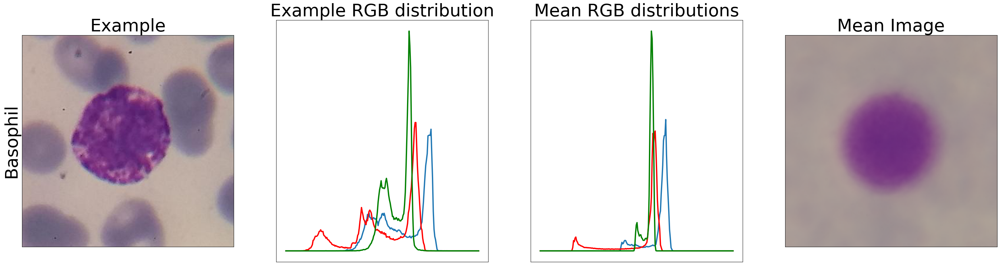

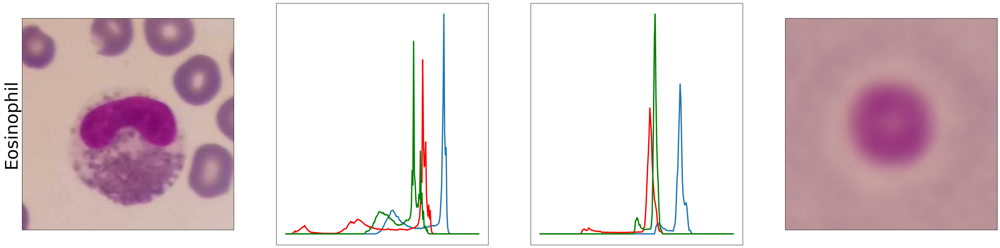

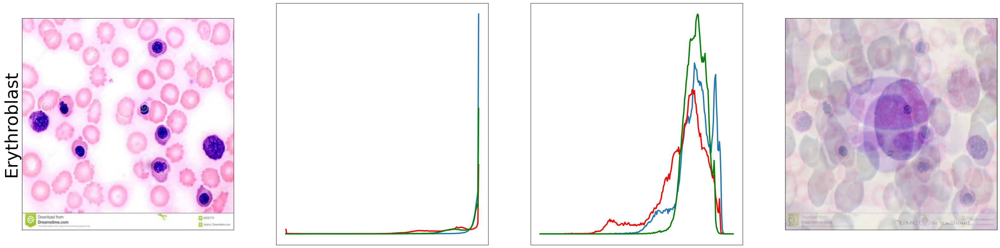

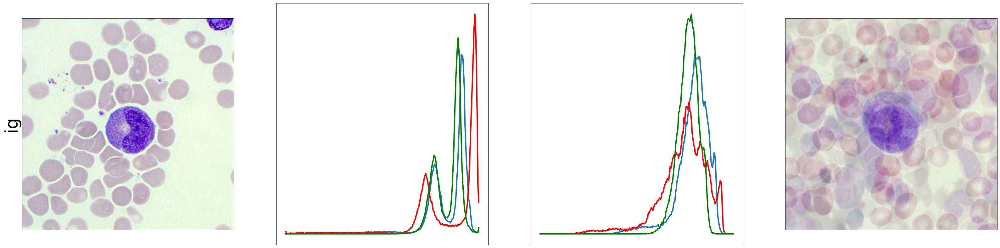

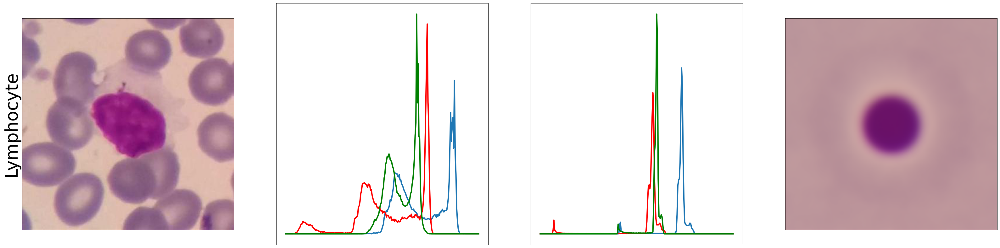

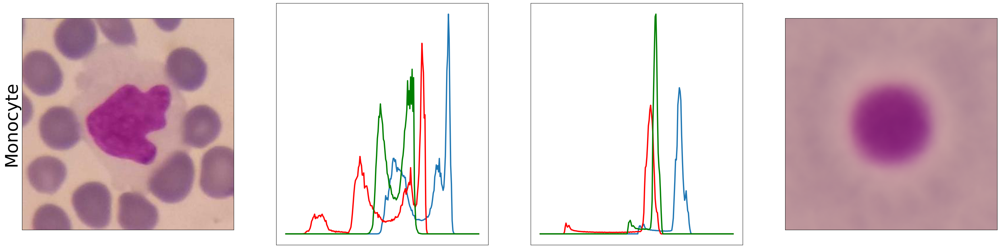

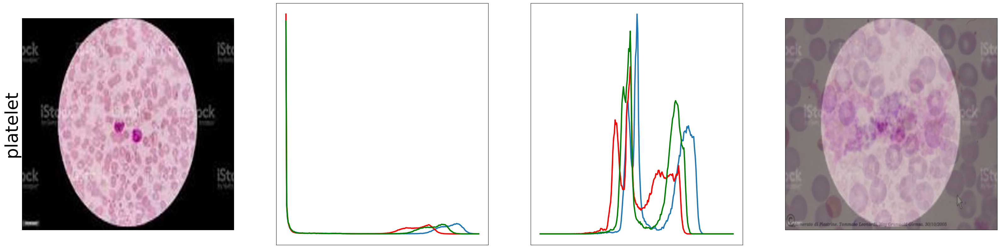

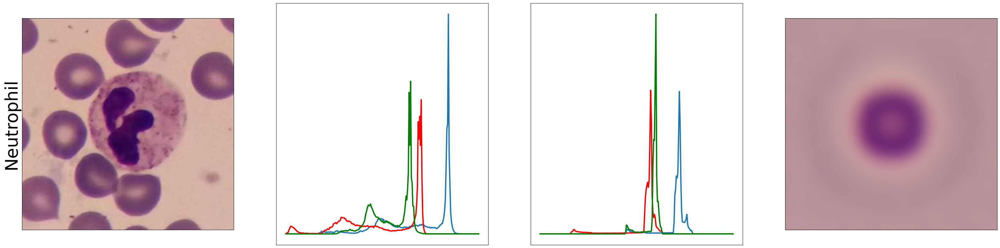

In [ ]:
for i,cell in enumerate(clefs):
    cell2=cell.split('_')[-1]
    
    image=Images_Moy[cell].astype('uint8')
    blue_color = cv2.calcHist([image], [0], None, [256], [0,256])
    red_color = cv2.calcHist([image], [1], None, [256], [0,256])
    green_color = cv2.calcHist([image], [2], None, [256], [0,256])
    blue_color_ex = cv2.calcHist([img[cell2]], [0], None, [256], [0,256])
    red_color_ex = cv2.calcHist([img[cell2]], [1], None, [256], [0,256])
    green_color_ex = cv2.calcHist([img[cell2]], [2], None, [256], [0,256])
    
    plt.figure(figsize=(40,10))
    plt.subplot(1,4,4)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image)
    if i==0:
        plt.title('Mean Image',fontsize=40)
    
    plt.subplot(1,4,3)
    plt.plot(range(0,256), blue_color, lw=3)
    plt.plot(range(0,256), red_color, color='red', lw=3)
    plt.plot(range(0,256), green_color, color='green', lw=3)
    plt.xticks([])
    plt.yticks([])
    if i==0:
        plt.title('Mean RGB distributions',fontsize=40)
        
    plt.subplot(1,4,1)
    plt.imshow(img[cell2])
    plt.xticks([])
    plt.yticks([])
    plt.ylabel(cell2,fontsize=40)
    if i==0:
        plt.title('Example',fontsize=40)
        
    plt.subplot(1,4,2)
    plt.plot(range(0,256), blue_color_ex, lw=3)
    plt.plot(range(0,256), red_color_ex, color='red', lw=3)
    plt.plot(range(0,256), green_color_ex, color='green', lw=3)
    plt.xticks([])
    plt.yticks([])
    if i==0:
        plt.title('Example RGB distribution',fontsize=40)

In [ ]:
# Step 1: Verify the contents of the `img` dictionary
print(img.keys())  # Print the keys in the `img` dictionary to verify its contents


dict_keys(['basophil', 'eosinophil', 'erythroblast', 'ig', 'lymphocyte', 'monocyte', 'neutrophil', 'platelet'])


In [ ]:
Affichage des histogrammes des pixel values pour les images moyennes

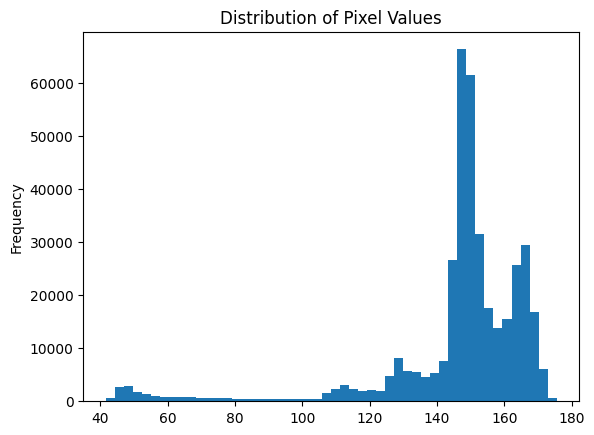

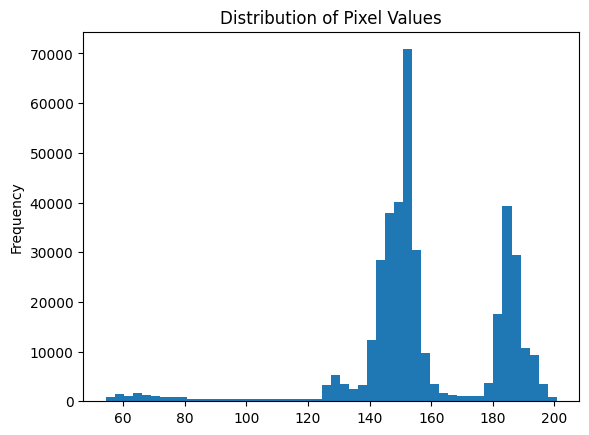

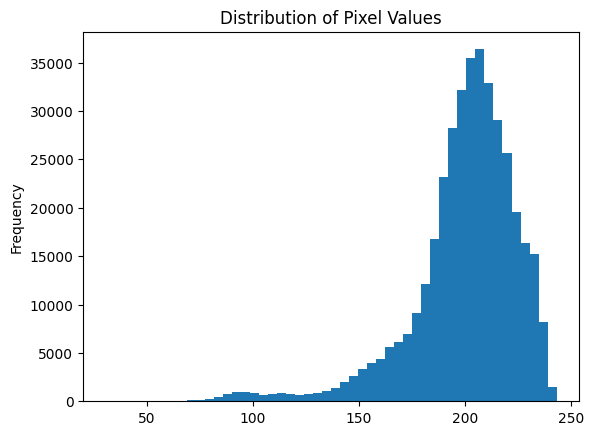

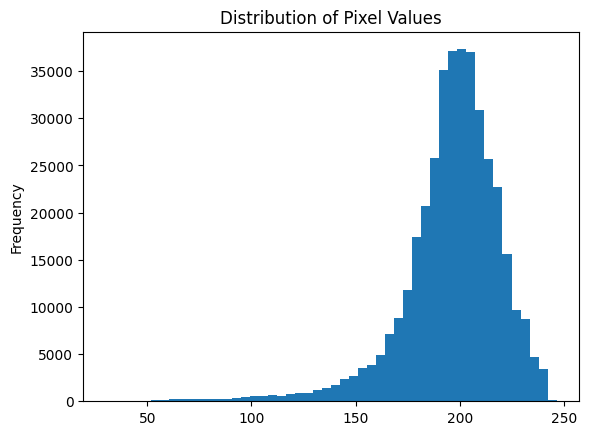

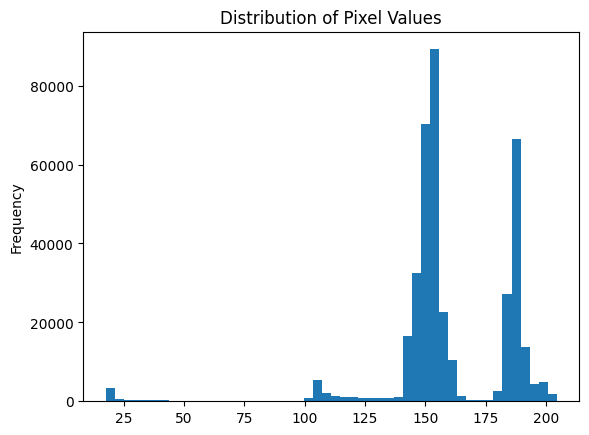

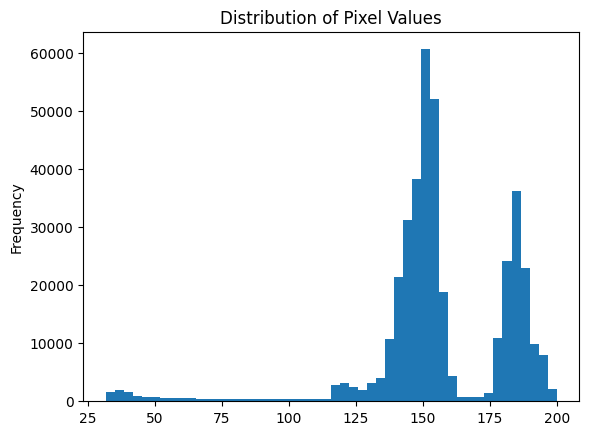

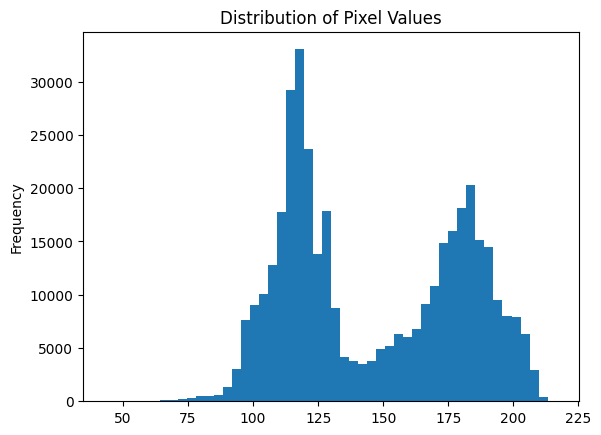

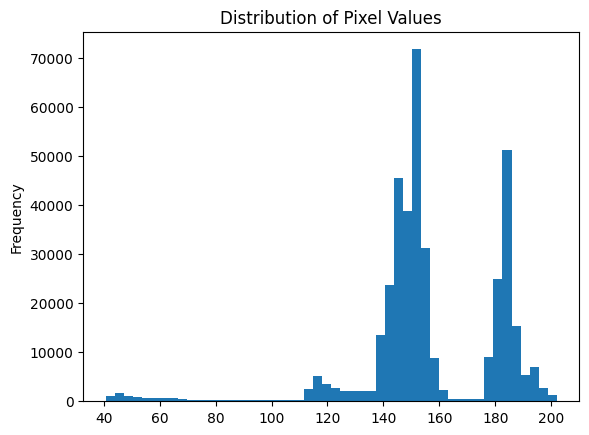

In [ ]:
for cle in clefs :
    pd.Series(Images_Moy[cle].flatten()).plot(kind='hist', bins=50, title='Distribution of Pixel Values')
    plt.show()
    
    #ajouter titres
    #ajouter légendes
    #mettre éventuellement en subplot pour afficher 4 par ligne sur 2 lignes par exemple
    
    